In [1]:
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

Copying Images

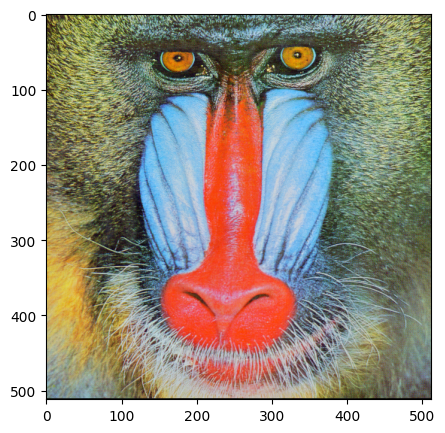

In [3]:
# Use the copy method to reassign an array to another variable
baboon = np.array(Image.open('baboon.png'))
plt.figure(figsize=(5,5))
plt.imshow(baboon )
plt.show()

In [4]:
# Without the copy method, the two variables point to the same memory location
A = baboon
id(A) == id(baboon)

True

In [5]:
B = baboon.copy()
id(B) == id(baboon)

False

In [6]:
baboon[:,:,] = 0

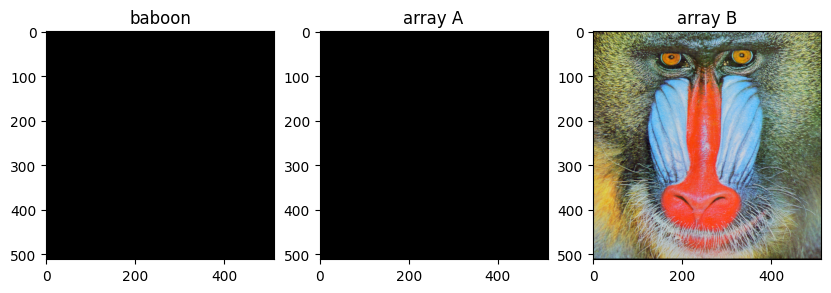

In [8]:
# Plot baboon, A, and B
plt.figure(figsize=(10,10))
plt.subplot(131)
plt.imshow(baboon)
plt.title("baboon")
plt.subplot(132)
plt.imshow(A)
plt.title("array A")
plt.subplot(133)
plt.imshow(B)
plt.title("array B")
plt.show()

Flipping Images

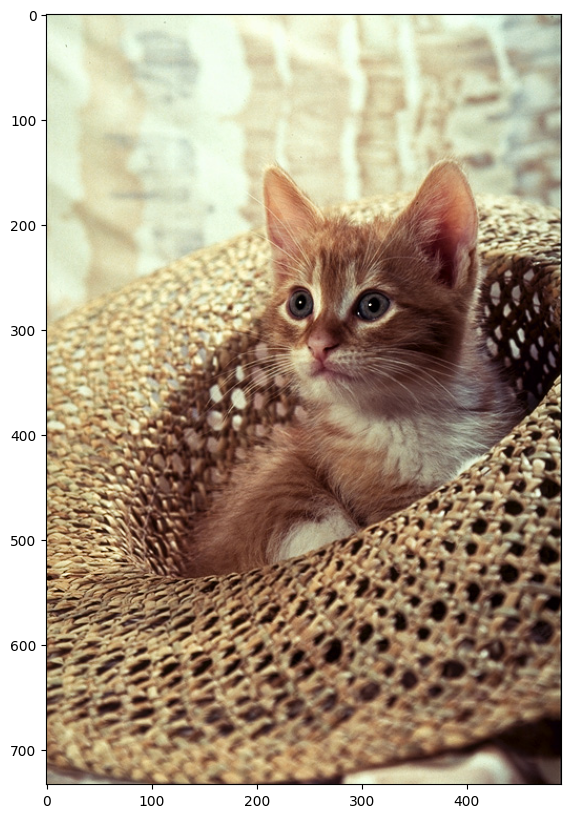

In [9]:
image = Image.open("cat.png")
plt.figure(figsize=(10,10))
plt.imshow(image)
plt.show()

In [16]:
array = np.array(image)
height, width, C = array.shape
print('width, height, C', width, height, C)

width, height, C 490 733 3


In [18]:
# Manually flip the array by creating an array of the same size, then fill the rows from bottom to top
array_flip = np.zeros((height, width, C), dtype=np.uint8)
for i,row in enumerate(array):
    array_flip[height - 1 - i, :, :] = row

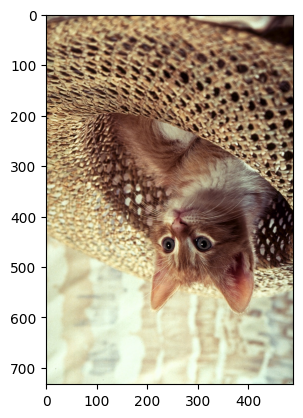

In [19]:
plt.imshow(array_flip)
plt.show()

In [14]:
# Use PIL to flip with a built-in function
from PIL import ImageOps

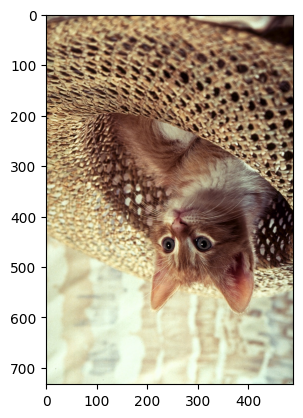

In [15]:
im_flip = ImageOps.flip(image)
plt.imshow(im_flip)
plt.show()

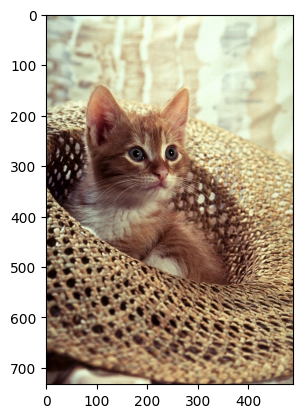

In [20]:
# There's also a built-in function for mirror
im_mirror = ImageOps.mirror(image)
plt.imshow(im_mirror)
plt.show()

In [21]:
# Transpose takes an integer value to perform a particular manipulation denoted by an integer
# Define a dictionary to see the values
flip = {"FLIP_LEFT_RIGHT": Image.FLIP_LEFT_RIGHT,
        "FLIP_TOP_BOTTOM": Image.FLIP_TOP_BOTTOM,
        "ROTATE_90": Image.ROTATE_90,
        "ROTATE_180": Image.ROTATE_180,
        "ROTATE_270": Image.ROTATE_270,
        "TRANSPOSE": Image.TRANSPOSE, 
        "TRANSVERSE": Image.TRANSVERSE}
for key, value in flip.items():
    print(key, ":", value)

FLIP_LEFT_RIGHT : 0
FLIP_TOP_BOTTOM : 1
ROTATE_90 : 2
ROTATE_180 : 3
ROTATE_270 : 4
TRANSPOSE : 5
TRANSVERSE : 6


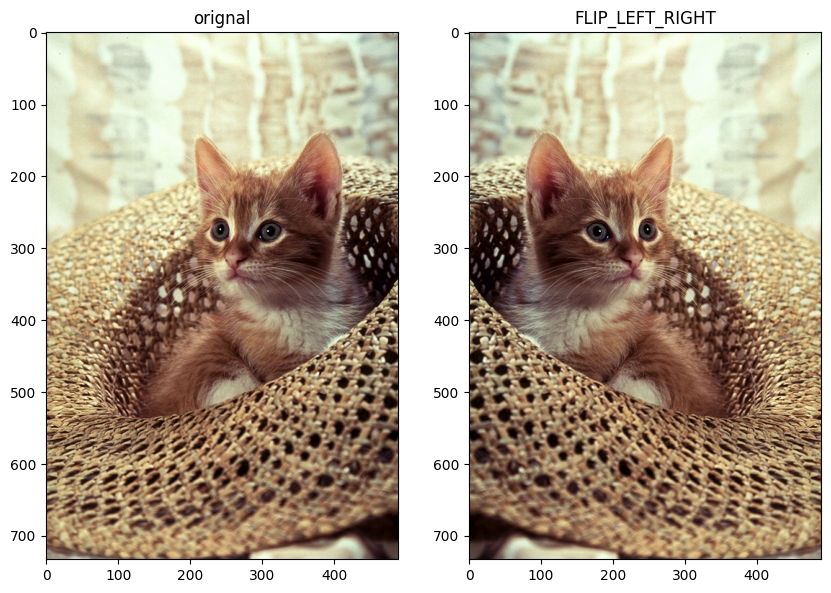

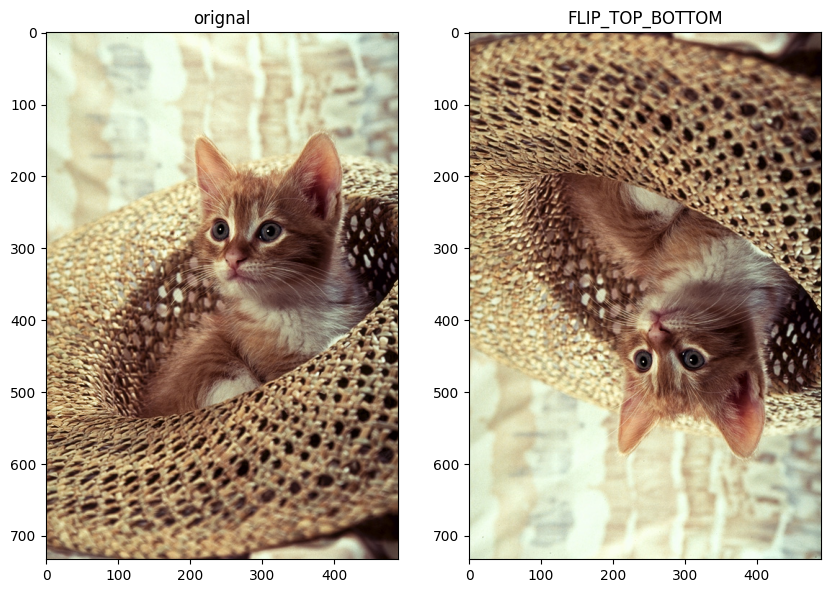

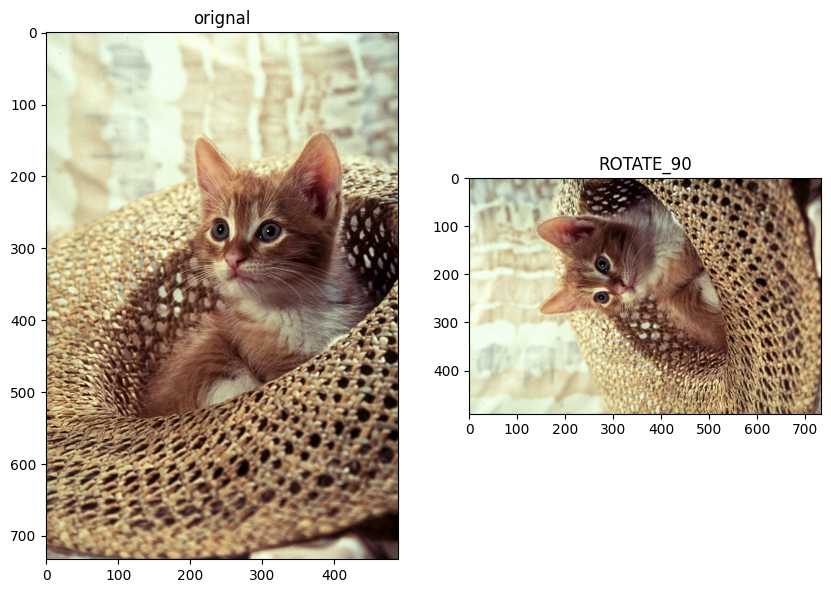

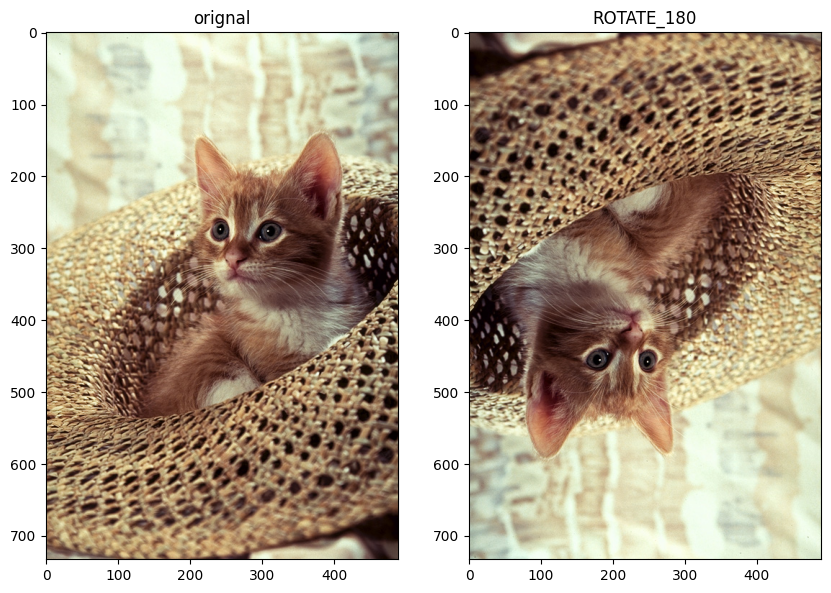

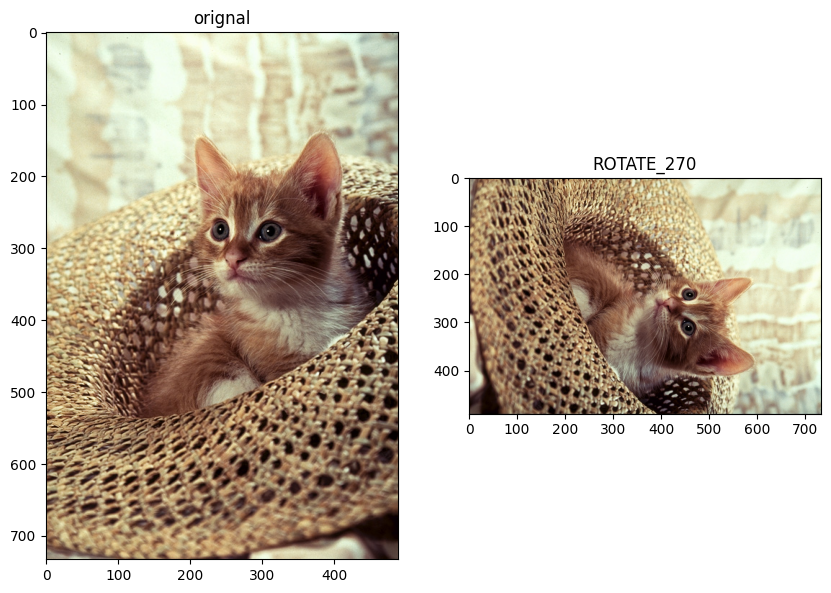

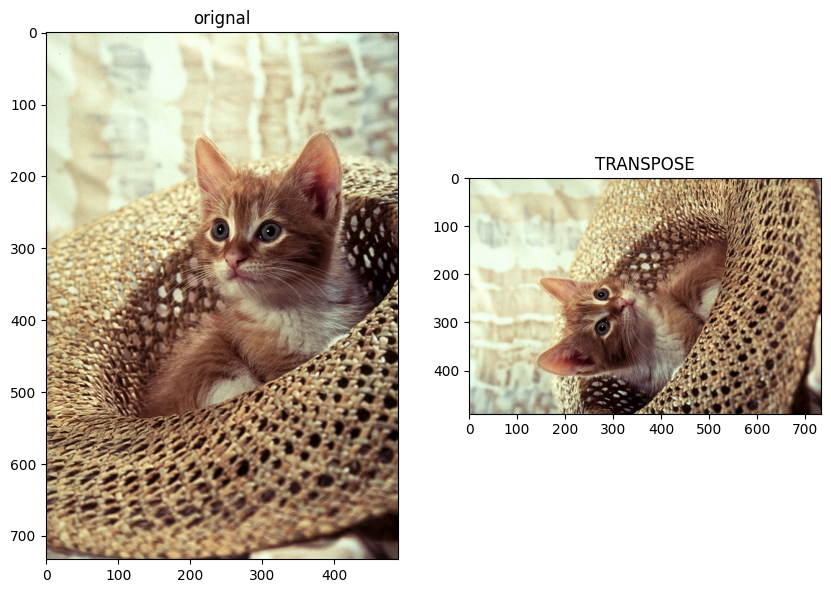

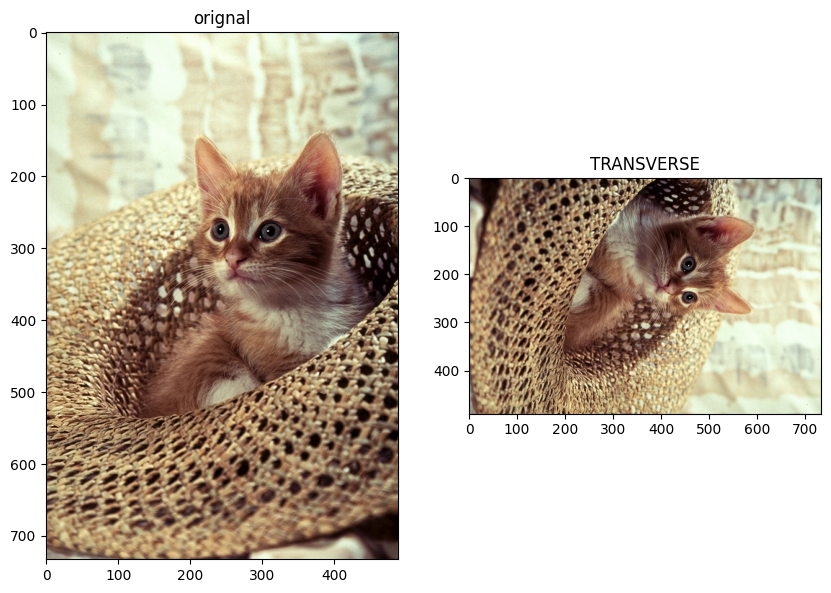

In [22]:
# Plot each transposition
for key, values in flip.items():
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(image)
    plt.title("orignal")
    plt.subplot(1,2,2)
    plt.imshow(image.transpose(values))
    plt.title(key)
    plt.show()

Cropping an Image

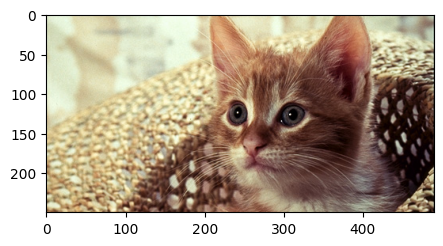

In [23]:
# Slice the array to create a new image
upper = 150
lower = 400
crop_top = array[upper: lower,:,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_top)
plt.show()

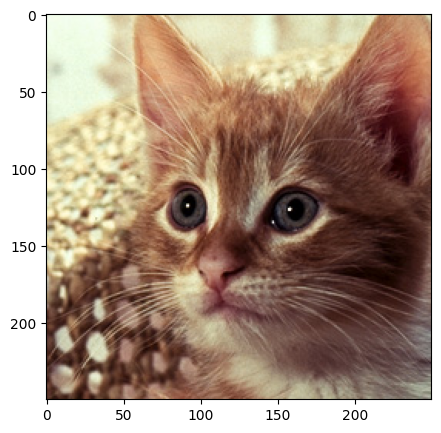

In [24]:
left = 150
right = 400
crop_horizontal = crop_top[: ,left:right,:]
plt.figure(figsize=(5,5))
plt.imshow(crop_horizontal)
plt.show()

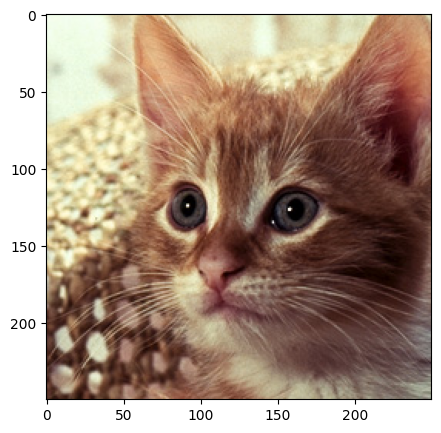

In [25]:
# PIL has a built in crop method so you don't have to use slicing
image = Image.open("cat.png")
crop_image = image.crop((left, upper, right, lower))
plt.figure(figsize=(5,5))
plt.imshow(crop_image)
plt.show()

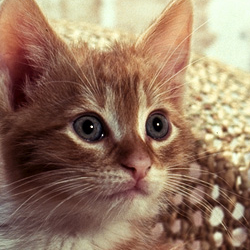

In [26]:
# Flip the cropped image
crop_image = crop_image.transpose(Image.FLIP_LEFT_RIGHT)
crop_image

Changing specific image pixels

In [27]:
# Per-pixel manipulation can be done with array indexing
array_sq = np.copy(array)
array_sq[upper:lower, left:right, 1:2] = 0

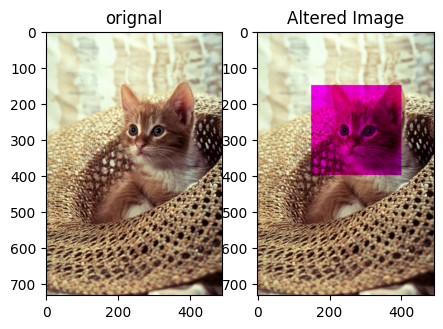

In [28]:
plt.figure(figsize=(5,5))
plt.subplot(1,2,1)
plt.imshow(array)
plt.title("orignal")
plt.subplot(1,2,2)
plt.imshow(array_sq)
plt.title("Altered Image")
plt.show()

In [29]:
# ImageDraw from PIL includes 2D graphics primitives
from PIL import ImageDraw

In [30]:
# Create a copy, because ImageDraw.Draw will update the original image passed to it

image_draw = image.copy()

In [31]:
image_fn = ImageDraw.Draw(im=image_draw) # im parameter is the image we are drawing in

In [32]:
# Draw a rectangle on the cat's face

shape = [left, upper, right, lower] 
image_fn.rectangle(xy=shape,fill="red")

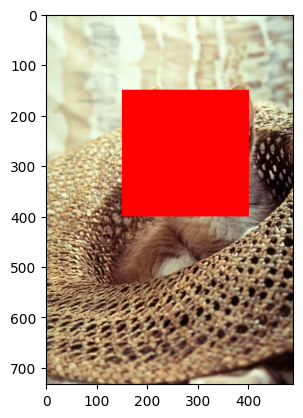

In [33]:
plt.imshow(image_draw)
plt.show()

In [34]:
# Add text overlay with ImageFont
from PIL import ImageFont

In [35]:
# Use the text method to add text to the image
image_fn.text(xy=(0,0), text = "box", fill=(0,0,0))

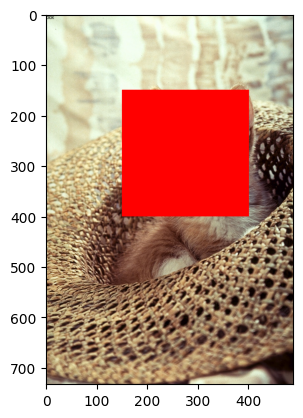

In [36]:
plt.imshow(image_draw)
plt.show()

In [37]:
# Overlay on image on another by reassigning pixel values from one image to another
image_lenna = Image.open("lenna.png")
array_lenna = np.array(image_lenna)

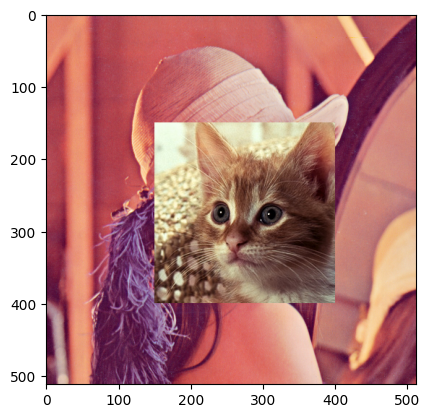

In [38]:
# Reassign pixel values by index range
array_lenna[upper:lower,left:right,:]=array[upper:lower,left:right,:]
plt.imshow(array_lenna)
plt.show()

In [39]:
# Images have a paste method that provides similar functionality
image_lenna.paste(crop_image, box=(left,upper))

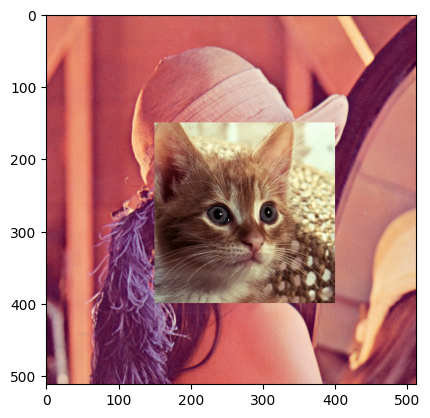

In [40]:
plt.imshow(image_lenna)
plt.show()

In [41]:
# Just like arrays, use copy on images to avoid pointing to the same place in memory
image = Image.open("cat.png")
new_image=image
copy_image=image.copy()

In [42]:
id(image)==id(new_image)

True

In [43]:
id(image)==id(copy_image)

False

In [44]:
image_fn= ImageDraw.Draw(im=image)
image_fn.text(xy=(0,0),text="box",fill=(0,0,0))
image_fn.rectangle(xy=shape,fill="red")

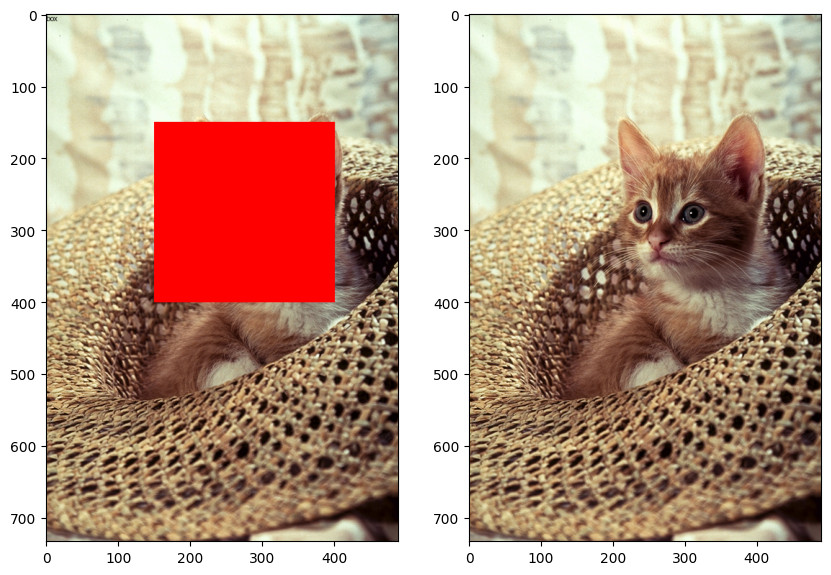

In [45]:
plt.figure(figsize=(10,10))
plt.subplot(121)
plt.imshow(new_image)
plt.subplot(122)
plt.imshow(copy_image)
plt.show()

Challenge: Open an image and create a PIL Image called im, flip im and create an image called im_flip. Mirror im and create an image called im_mirror. Finally, plot both images.

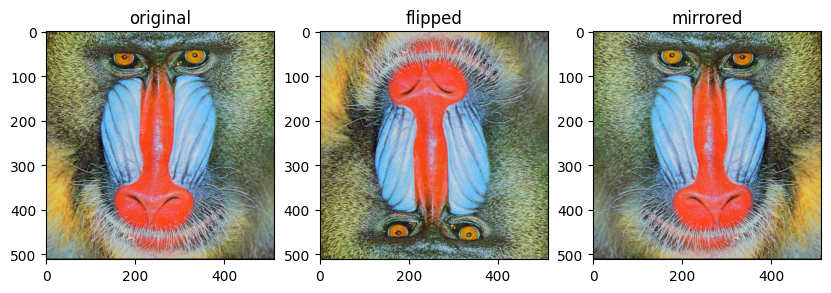

In [46]:
im = Image.open("baboon.png")
im_flip = ImageOps.flip(im)
im_mirror = ImageOps.mirror(im)
plt.figure(figsize=(10,10))
plt.subplot(1,3,1)
plt.imshow(im)
plt.title("original")
plt.subplot(1,3,2)
plt.imshow(im_flip)
plt.title("flipped")
plt.subplot(1,3,3)
plt.imshow(im_mirror)
plt.title("mirrored")
plt.show()